In [21]:
import pandas as pd
import plotly.express as px
from datetime import datetime

# Maximum UV Index Per Month in London
## Introduction
### UV Index
The **UV Index** is a measure of the intensity of UV light that poses a risk to humans. It indicates whether people need to wear sun protection and how long it will take for unprotected skin to burn. 

The UV Index is affected by several different factors including the angle of the sun and cloud cover. The typical variation of UV index per day should be a bell shaped curve. The UV index increases in the morning as the sun moves towards the middle of the sky. By about midday, the UV index should reach a peak (where the sun's rays have maximum intensity) and then decline towards evening. Cloud cover and other variable weather effects drastically impact the bell shaped curve. On a blue sky day you should see a near perfect bell shaped curve. On a cloudy day, you are likely to see a heavily flattened and diminished curve. On a day with scattered and intermittent cloud, you will see the outline of the bell shaped curve but will see vertical slices cut out of it during heavy cloud cover periods. 

The UV Index daily variation is also affected by time of year - summer months see the highest UV index peak and winter months see a much smaller peak. 

The below plot shows an example of the bell shaped UV index curve for a blue sky day with no clouds during summer. 

![](example_curve.png)

### Objective
In this project, we want to estimate the bell shaped maximum UV index in London i.e. the maximum UV index to expect throughout the day in London. We are effectively trying to find the UV index curve that relates to a blue sky, no clouds day in London. We want to estimate this curve for each month of the year. This plot could be useful for example to identify what months of the year require sun protection and what times of day pose the greatest sun burn risk. 

## Data



Our data was supplied by the UK Health Security Agency (UKHSA). UKHSA runs a network of UV monitoring sites across the UK - the data can be viewed [here](https://uk-air.defra.gov.uk/data/uv-index-graphs). We requested data from the London site for the years 2019 and 2020 (by emailing solar@ukhsa.gov.uk). The London site is situated on the roof of St Thomas Hospital, further details can be found [here](https://uk-air.defra.gov.uk/networks/site-info?uka_id=UKA00583). 

The data records the UV index at multiple time periods throughout the day for all days in 2019 and 2020. Below we load the data (which is stored in a 2019 file and a 2020 file):

In [22]:
uv_20 = pd.read_csv('London 2020.txt', sep='\t')
uv_19 = pd.read_csv('London 2019.txt', sep='\t')

uv_20

,Time,01JAN20C,02JAN20C,03JAN20C,04JAN20C,05JAN20C,06JAN20C,07JAN20C,08JAN20C,09JAN20C,...,22DEC20C,23DEC20C,24DEC20C,25DEC20C,26DEC20C,27DEC20C,28DEC20C,29DEC20C,30DEC20C,31DEC20C
0,00:04:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,00:09:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,00:14:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,00:19:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,00:24:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283,23:39:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
284,23:44:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
285,23:49:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
286,23:54:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Format Data For Plotting

The data uses the time as a key / index (it is the first column). Every subsequent column is a different date and contains the UV index at each time. E.g. the second column of the 2020 data is called **01JAN20C** and each row records the UV index on 1st Jan 2020 at the time indicated in the **Time** column. We want to combine the 2020 and 2019 data into a single dataframe. In order to do this, we first need to check that the Time periods defined in each dataset match: 

In [23]:
all(uv_20.Time == uv_19.Time)

True

We have confirmed they match. Now we will add the columns from 2019 onto the right of the 2020 data (after dropping the 2019 **Time** column because it is redundant i.e. already defined by the **Time** column in 2020):

In [24]:
# Remove the Time index column from 2019 data, we only need one Time column
# (the one from the 2020 data)
uv_19 = uv_19.iloc[:, 1:]
uv = pd.concat([uv_20, uv_19], axis = 1)
uv

,Time,01JAN20C,02JAN20C,03JAN20C,04JAN20C,05JAN20C,06JAN20C,07JAN20C,08JAN20C,09JAN20C,...,22DEC19C,23DEC19C,24DEC19C,25DEC19C,26DEC19C,27DEC19C,28DEC19C,29DEC19C,30DEC19C,31DEC19C
0,00:04:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,00:09:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,00:14:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,00:19:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,00:24:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283,23:39:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
284,23:44:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
285,23:49:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
286,23:54:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


We now parse the date columns headers (e.g. **01JAN20C**) into python datetime format - this allows us to easily group or manipulate the dates. 

In [25]:
def convert_to_dt(string):
    str_format = '%d%b%yC'
    return datetime.strptime(string, str_format)
    
# Select date columns
str_dates = uv.columns[1:]
# update column headers to use datetime format
uv.columns = ['Time'] + [convert_to_dt(string) for string in str_dates]

uv

,Time,2020-01-01 00:00:00,2020-01-02 00:00:00,2020-01-03 00:00:00,2020-01-04 00:00:00,2020-01-05 00:00:00,2020-01-06 00:00:00,2020-01-07 00:00:00,2020-01-08 00:00:00,2020-01-09 00:00:00,...,2019-12-22 00:00:00,2019-12-23 00:00:00,2019-12-24 00:00:00,2019-12-25 00:00:00,2019-12-26 00:00:00,2019-12-27 00:00:00,2019-12-28 00:00:00,2019-12-29 00:00:00,2019-12-30 00:00:00,2019-12-31 00:00:00
0,00:04:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,00:09:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,00:14:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,00:19:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,00:24:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283,23:39:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
284,23:44:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
285,23:49:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
286,23:54:41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Now we will convert the dataframe into a simpler format for plotting. We want to unpivot the date columns such that rather than having a separate column per date, we instead have a column called **date** that defines the date and a separate column called **uv** that records the uv index corresponding to that date and time. 

In [26]:
uv_plot = pd.melt(uv, id_vars=['Time'], var_name='date', 
                     value_name='uv')
uv_plot 

,Time,date,uv
0,00:04:41,2020-01-01,0.0
1,00:09:41,2020-01-01,0.0
2,00:14:41,2020-01-01,0.0
3,00:19:41,2020-01-01,0.0
4,00:24:41,2020-01-01,0.0
...,...,...,...
209947,23:39:41,2019-12-31,0.0
209948,23:44:41,2019-12-31,0.0
209949,23:49:41,2019-12-31,0.0
209950,23:54:41,2019-12-31,0.0


We now extract the month, day and the date as a string (e.g. '01-04-20') from each date.

In [27]:
uv_plot['month'] = uv_plot['date'].dt.strftime("%B")
uv_plot['day'] = uv_plot['date'].dt.day
uv_plot['date_str'] = uv_plot['date'].dt.strftime("%d-%m-%y")

uv_plot

,Time,date,uv,month,day,date_str
0,00:04:41,2020-01-01,0.0,January,1,01-01-20
1,00:09:41,2020-01-01,0.0,January,1,01-01-20
2,00:14:41,2020-01-01,0.0,January,1,01-01-20
3,00:19:41,2020-01-01,0.0,January,1,01-01-20
4,00:24:41,2020-01-01,0.0,January,1,01-01-20
...,...,...,...,...,...,...
209947,23:39:41,2019-12-31,0.0,December,31,31-12-19
209948,23:44:41,2019-12-31,0.0,December,31,31-12-19
209949,23:49:41,2019-12-31,0.0,December,31,31-12-19
209950,23:54:41,2019-12-31,0.0,December,31,31-12-19


## Plot All UV Index Data

Below, we plot the UV index data for every day in the dataset (all days in 2019 and 2020): 

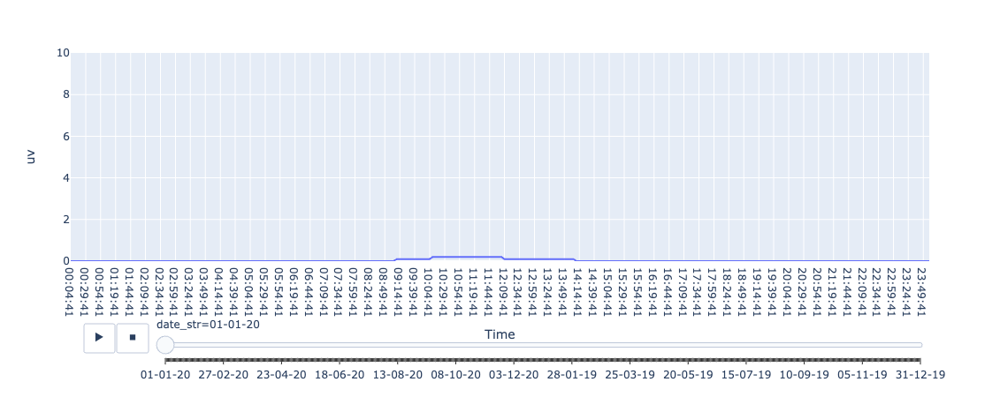

In [28]:
fig = px.line(uv_plot, x='Time', y="uv", 
              animation_frame='date_str',
              height = 450, range_y=(0, 10))
fig.show()

## Find Max UV index Per Month
We will now aggregate across each month and select the maximum UV index at each time. This should hopefully provide a fairly smooth UV index curve that indicates the maximum UV index per month:

In [30]:
uv_max = uv_plot.groupby(['Time', 'month'], as_index = False)['uv'].max()
uv_max.head()

,Time,month,uv
0,00:04:41,April,0.0
1,00:04:41,August,0.0
2,00:04:41,December,0.0
3,00:04:41,February,0.0
4,00:04:41,January,0.0


We will now order the month column according to month (e.g. January, February...etc.) rather than alphabetically. 

In [31]:
order = ['January', 'February', 'March', 'April', 'May', 'June', 'July',
         'August', 'September', 'October', 'November', 'December']
uv_max.month = pd.Categorical(uv_max.month, categories=order, 
                                  ordered=True)
uv_max = uv_max.sort_values(by=['Time', "month"], ascending = True)

## Plot Max UV Index Per Month
Below we create the main plot for this project, the maximum UV index per month in London. We have added background highlighting for the different qualitative categories of UV index (Low, Moderate, High etc.) and a vertical line to highlight where the UV index curve peaks (at noon). 

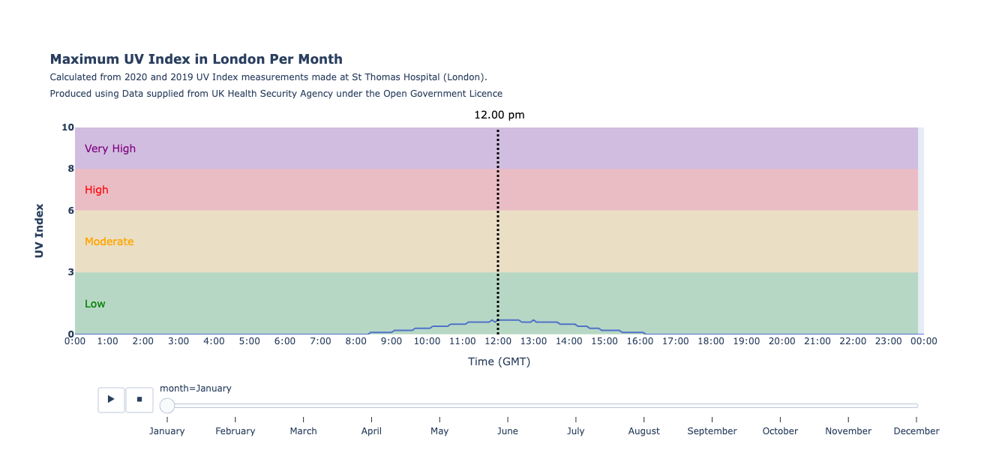

In [35]:
title = ('<b>Maximum UV Index in London Per Month</b><span style=\"font-size: 12px;\"><br>Calculated from 2020'
         + ' and 2019 UV Index measurements made at St Thomas Hospital (London).'
         + '<br>Produced using Data supplied from UK Health Security Agency under the Open Government Licence')
# Create basic plot
fig = px.line(uv_max, x='Time', y="uv", 
              animation_frame='month',
              height = 600, range_y=(0, 10), 
              labels={'uv':'<b>UV Index</b>', 'Time': 'Time (GMT)'}, 
              title = title)
# Add green highlight to Low UV index region (from 0 to 3) 
fig.add_shape(type="rect", 
              x0=0, x1=285, y0 = 0, y1 = 3, 
              opacity = 0.2,
              line=dict(color="green",
                        width=0),
              fillcolor="green"
        )
# Add orange highlight to Moderate UV index region (from 3 to 6) 
fig.add_shape(type="rect", x0=0, x1=285, y0 = 3, y1 = 6, 
              opacity = 0.2,
              line=dict(color="orange",
                        width=0),
              fillcolor="orange",
)
# Add red highlight to high UV index region (from 6 to 8) 
fig.add_shape(type="rect", x0=0, x1=285, y0 = 6, y1 = 8, 
              opacity = 0.2,
              line=dict(color="red",
                        width=0),
              fillcolor="red",
)
# Add purple highlight to Very high UV index region (from 8 to 10) 
fig.add_shape(type="rect", x0=0, x1=285, y0 = 8, y1 = 10,
              opacity = 0.2,
              line=dict(color="purple",
                        width=0),
              fillcolor="purple",
)

# Define x position of vertical line
pos = 143
# Add vertical line at 12.00 pm
fig.add_shape(type="line", x0=pos, y0=0, x1=pos, y1=10.5,
              line=dict(color="black",
                        width=3,
                        dash="dot")
             )
# Remove vertical and horizontal gridlines
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

# Add 'Very High' Text annotation
fig.add_annotation(x = 0.01, y = 9,
                   text="Very High",
                   showarrow=False, xref = 'paper', 
                   font=dict(size=14,
                             color="purple")
                )
# Add 'High' Text annotation
fig.add_annotation(x = 0.01, y = 7, text="High",
                   showarrow=False, xref = 'paper', 
                   font=dict(size=14, 
                             color="red")
                )
# Add 'Moderate' Text annotation
fig.add_annotation(x = 0.01, y = 4.5, 
                   text="Moderate", showarrow=False, 
                   xref = 'paper', 
                   font=dict(size=14, 
                             color="orange")
            )
# Add 'Low' Text annotation
fig.add_annotation(x = 0.01, y = 1.5,
                   text="Low", showarrow=False, 
                   xref = 'paper', 
                   font=dict(size=14, 
                             color="green")
            )
# Add '12.00 pm' Text annotation
fig.add_annotation(x = 0.5, y = 1.1, 
                   text="12.00 pm", showarrow=False, 
                   xref = 'paper', yref = 'paper',
                   font=dict(size=14, 
                             color="black")
            )
# Update y axis UV index tick labels to show boundaries of the different UV regions
fig.update_layout(yaxis = dict(tickmode = 'array',
                               tickvals = [0, 3,6,8,10],
                               ticktext = ['<b>0</b>', '<b>3</b>', 
                                           '<b>6</b>','<b>8</b>','<b>10</b>']
                               )
                 )
# Update x axis Time tick labels to be hourly
fig.update_layout(
    xaxis = dict(tickmode = 'array',
    tickvals = ['00:04:41','00:59:41', '01:59:41', '02:59:41',
                '03:59:41', '04:59:41', '05:59:41','06:59:41', 
                '07:59:41','08:59:41','09:59:41','10:59:41',
                '11:59:41','12:59:41','13:59:41','14:59:41',
                '15:59:41','16:59:41','17:59:41','18:59:41',
                '19:59:41', '20:59:41','21:59:41','22:59:41',
                '23:59:41'],
    ticktext = ['0:00','1:00','2:00','3:00','4:00','5:00','6:00',
                '7:00','8:00','9:00','10:00','11:00','12:00',
                '13:00','14:00','15:00','16:00','17:00','18:00',
                '19:00','20:00','21:00','22:00','23:00', '00:00']
    )
)
# Tweak plot margins to title can be read
fig.update_layout(margin=dict(
        l=100,
        r=100,
        b=100,
        t=170,)
                 )
# Change hover data mode
fig.update_layout(hovermode="x")
# Change transition time between animations to 2 seconds
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 2000

fig.show()

Save plot to file. 

In [33]:
fig.write_html('london_UV_curve.html',auto_play = False)